## Import Libs

In [1]:
import json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
import nltk
import tensorflow
from nltk.corpus import stopwords
from nltk.stem.snowball import SnowballStemmer
import re
import sys
import warnings
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
import warnings
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import accuracy_score
from sklearn.multiclass import OneVsRestClassifier
import joblib
import os

2024-07-13 19:25:42.328917: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:479] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-07-13 19:25:42.359481: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:10575] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-07-13 19:25:42.359526: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1442] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-07-13 19:25:42.374966: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-07-13 19:25:44.333888: W tensorflow/compiler/tf

### Import Dataset

In [2]:
# Construct the absolute file path
file_path = '../dataset/Product_Explanation.txt'
# Initialize lists to store the parsed data
product_ids = []
descriptions = []

with open(file_path, 'r') as file:
    for line in file:  # Adjust the range to read more lines if needed
        #print(line)
        product_id, description = line.strip().split(';', 1)
        #print(product_id ,"+", description)
        product_ids.append(product_id)
        descriptions.append(description)
print(len(product_ids))
# Open and read the file

1800


In [3]:
file_path = '../dataset/Product_Categories.txt'

# Initialize lists to store the parsed data
categories = []
turkish_lower_mapping = str.maketrans('İI', 'ii')

with open(file_path, 'r') as file:
    for line in file:  # Adjust the range to read more lines if needed
        #print(line)
        _, category = line.strip().split(';', 1)
        category = category.strip()
        if '>' in category:
            category = category.split('>')[0]  # Take the first segment after splitting by '>'
        #print(category)
        category = category.lower().translate(turkish_lower_mapping)  # Lower with Turkish chars
        category = category.strip()  # To remove empty char
        categories.append(category)
        
print(len(categories))


1800


make a list of category for each product

### Remove dublicates in categories

First we need to take a look at all category names

In [6]:
#find unique category

from collections import Counter

unique_categories = list(set(categories))
counter = Counter(categories)
counter

Counter({'bilgisayar': 513,
         'bilgisayar bileşenleri': 220,
         'cep telefonu': 92,
         'aksesuar ürünleri': 66,
         'tüketici elektroniği': 62,
         'bilgisayar tablet yazıcı': 32,
         '': 29,
         'elektronik': 28,
         'küçük ev aletleri': 24,
         'çevre birimleri': 24,
         'tüketim malzemeleri': 24,
         'aksesuar & sarf malz.': 24,
         'oyun - hobi': 23,
         'yazılım': 22,
         'televizyon': 18,
         'fotoğraf / elektronik': 16,
         'foto & kamera': 16,
         'tüketim ürünleri': 15,
         'toner kartuş şerit': 15,
         'ses ve görüntü': 14,
         'bilgi teknolojileri': 14,
         'ev elektroniği': 13,
         'tv & ses': 12,
         'yazıcılar': 11,
         'oyun &amp; hobi̇': 11,
         'monitör': 10,
         'foto&kamera': 10,
         'çevre birimler': 10,
         'baskı ürünleri': 10,
         'network ürünleri': 8,
         'fotoğraf & kamera': 8,
         'mürekkep kartuşları':

* "bilgisayar bileşenleri" + "bilgisayar ürünleri" + "oem ürünleri" + "oem & çevre birimleri" + "bilgisayar bileşenleri (oem)"
* "çevre birimleri" + "bilgisayar parçaları" + "çevre birimi"
* "televizyon" + "televizyonlar" + "led TV" + "tv & görüntü sistemleri"
* "pc" + "bilgisayar" + "Kişisel Bilgisayarlar"
* "yazılım ürünleri" + "Yazılım ve Hizmetler" + "Yazılım"
* "Hobi & Oyun Konsolları" + "Oyun & Oyun Konsolu" + "oyun - hobi"
* "hafıza kartları" + "hafıza kartı"


Since those categories mostly not different then other, we can merge them

In [5]:
remove_list = [
    ["bilgisayar bileşenleri", "bilgisayar ürünleri", "oem ürünleri", "oem & çevre birimleri", "bilgisayar bileşenleri (oem)", "oem"],
    ["çevre birimleri", "bilgisayar parçaları", "çevre birimi"],
    ["televizyon", "televizyonlar", "led tv", "tv & görüntü sistemleri"],
    ["bilgisayar", "pc", "kişisel bilgisayarlar", "bilgisayarlar", "bi̇lgi̇sayar"],
    ["yazılım","yazılım ürünleri", "yazılım ve hizmetler"],
    ["oyun - hobi","hobi & oyun konsolları", "oyun & oyun konsolu"],
    ["hafıza kartları", "hafıza kartı"],
    ["ütü","ütüler"],
    ["ekran kartı", "ekran kartları"],
    ["monitör", "monitörler"],
    ["yazıcılar",'yazıcı/tarayıcı/fax',"yazıcı"],
    ['cep telefonu','cep telefonları','telefon']
]

for i in range(len(categories)):
    for j in range(len(remove_list)):
        if categories[i] in remove_list[j]:
                categories[i] = remove_list[j][0]
unique_categories = list(set(categories))

            

## Create Data Frame

In [7]:
# creating dataframe with three rows (name,description,categories)
column_names = ['id','description','categories']
df = pd.DataFrame(columns = column_names)

In [8]:
df = pd.DataFrame(list(zip(product_ids,descriptions,categories)) ,columns = column_names)
df = df.dropna(subset=['description'])  # Drop rows where 'description' is NaN
df = df[df['description'] != ''] 
df = df[df['description'] != 'null'] 

# Reset index
df = df.reset_index(drop=True)
df

,id,description,categories
0,462,HP Pavilion 11-n000nt Pentium N3540 4GB 750GB ...,bilgisayar
1,1286,STOKTAN AYNI GÜN TESLİM AYNI GÜN KARGO iPhone ...,cep telefonu
2,1290,Ağırlık (Gr.) 115 Boyut (mm.) 132.4 x 65.5 x 6...,cep telefonu
3,1300,"ÖZELLİKLER Ekran Ekran Boyutu 48"" Ekran Boyutu...",ev elektroniği
4,1665,Ürün Kodu : 40061255166 Genel Özellikler Panel...,bilgisayar
...,...,...,...
1477,1040055,Powersupply Gücü :550WGaranti Süresi :24 Ay,cooler master 550w rs550-80gaj3-eu güç kaynağı
1478,1040520,Baskı Rengi :MaviYazdırma Teknolojisi :LaserBa...,canon crg-731c toner kartuş mavi
1479,1040521,Baskı Rengi :KırmızıYazdırma Teknolojisi :Lase...,canon crg-731m toner kartuş kırmızı
1480,1040676,Disk Kapasite Aralığı :2 TB - 4 TBGaranti Süre...,zyxel nsa-325 2x4tb disk destekli depolama üni...


There are total 1482 products listed in the product.json file. As each instanse can belong to multiple categories, so these types of problems are known as multi-label classification problem, where we have a set of target labels. If there are multiple categories but each instance is assigned only one, therefore such problems are known as multi-class classification problem.

In [9]:
cat = pd.DataFrame(df['categories'].to_list()) # listing the categories seperately
cat

,0
0,bilgisayar
1,cep telefonu
2,cep telefonu
3,ev elektroniği
4,bilgisayar
...,...
1477,cooler master 550w rs550-80gaj3-eu güç kaynağı
1478,canon crg-731c toner kartuş mavi
1479,canon crg-731m toner kartuş kırmızı
1480,zyxel nsa-325 2x4tb disk destekli depolama üni...


In [10]:

# finding total unique categories/classes from which our prediction will belong too
category_0 = cat[0].unique()


cates = np.concatenate([category_0])
cates = list(dict.fromkeys(cates))
cates = [x for x in cates if x is not None] # remove None
len(cates) # number of unique classes/categories

201

In [11]:
cat = pd.concat([cat,pd.DataFrame(columns = list(cates))]) # concatnate categories/classes to original dataframe
cat.fillna(0, inplace = True) # fill with zero
cat

/tmp/ipykernel_601767/735642600.py:2: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  cat.fillna(0, inplace = True) # fill with zero


,0,bilgisayar,cep telefonu,ev elektroniği,pc / monitör,bilgisayar bileşenleri,fotoğraf / elektronik,küçük ev aletleri,televizyon,android tablet,...,xigmatek cpa-070bcd-u42 700w 82 plus bronze psu,zalman cnps11x performa intel/amd cpu soğutucu,philips 18.5 193v5lsb2-62 led monitör 5ms siyah,sony xperia z2 d6503 16gb 3g cep telefonu (beyaz),oki şerit 5720-5790 şerit (44173405),cooler master 550w rs550-80gaj3-eu güç kaynağı,canon crg-731c toner kartuş mavi,canon crg-731m toner kartuş kırmızı,zyxel nsa-325 2x4tb disk destekli depolama ünitesi,corsair force gs 240 gb ssd disk cssd-f240gbgs-bk
0,bilgisayar,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,cep telefonu,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,cep telefonu,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,ev elektroniği,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,bilgisayar,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1477,cooler master 550w rs550-80gaj3-eu güç kaynağı,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1478,canon crg-731c toner kartuş mavi,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1479,canon crg-731m toner kartuş kırmızı,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1480,zyxel nsa-325 2x4tb disk destekli depolama üni...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [12]:


# filling attendence for all the categories/classes
for i in range(1):
  row = 0
  for category in cat[i]:
    if category!= 0:
      cat.loc[row,category] = 1 # loc is label-based, which means that you have to specify rows and columns based on their row and column labels.
    row = row + 1
# iloc is integer position-based, so you have to specify rows and columns by their integer position values (0-based integer position)
     
cat

,0,bilgisayar,cep telefonu,ev elektroniği,pc / monitör,bilgisayar bileşenleri,fotoğraf / elektronik,küçük ev aletleri,televizyon,android tablet,...,xigmatek cpa-070bcd-u42 700w 82 plus bronze psu,zalman cnps11x performa intel/amd cpu soğutucu,philips 18.5 193v5lsb2-62 led monitör 5ms siyah,sony xperia z2 d6503 16gb 3g cep telefonu (beyaz),oki şerit 5720-5790 şerit (44173405),cooler master 550w rs550-80gaj3-eu güç kaynağı,canon crg-731c toner kartuş mavi,canon crg-731m toner kartuş kırmızı,zyxel nsa-325 2x4tb disk destekli depolama ünitesi,corsair force gs 240 gb ssd disk cssd-f240gbgs-bk
0,bilgisayar,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,cep telefonu,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,cep telefonu,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,ev elektroniği,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,bilgisayar,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1477,cooler master 550w rs550-80gaj3-eu güç kaynağı,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
1478,canon crg-731c toner kartuş mavi,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
1479,canon crg-731m toner kartuş kırmızı,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1480,zyxel nsa-325 2x4tb disk destekli depolama üni...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0


In [13]:

df2 = pd.concat([df['id'],df['description'],cat.loc[:,"bilgisayar":]],axis=1) # creating new dataframe which contains name of product,description and categories it belong to
df2.head()
     

,id,description,bilgisayar,cep telefonu,ev elektroniği,pc / monitör,bilgisayar bileşenleri,fotoğraf / elektronik,küçük ev aletleri,televizyon,...,xigmatek cpa-070bcd-u42 700w 82 plus bronze psu,zalman cnps11x performa intel/amd cpu soğutucu,philips 18.5 193v5lsb2-62 led monitör 5ms siyah,sony xperia z2 d6503 16gb 3g cep telefonu (beyaz),oki şerit 5720-5790 şerit (44173405),cooler master 550w rs550-80gaj3-eu güç kaynağı,canon crg-731c toner kartuş mavi,canon crg-731m toner kartuş kırmızı,zyxel nsa-325 2x4tb disk destekli depolama ünitesi,corsair force gs 240 gb ssd disk cssd-f240gbgs-bk
0,462,HP Pavilion 11-n000nt Pentium N3540 4GB 750GB ...,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1286,STOKTAN AYNI GÜN TESLİM AYNI GÜN KARGO iPhone ...,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1290,Ağırlık (Gr.) 115 Boyut (mm.) 132.4 x 65.5 x 6...,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1300,"ÖZELLİKLER Ekran Ekran Boyutu 48"" Ekran Boyutu...",0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1665,Ürün Kodu : 40061255166 Genel Özellikler Panel...,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [14]:
df2.shape

(1482, 203)

# Data Analysis

In [15]:
bar_plot = pd.DataFrame()
bar_plot['category'] = df2.columns[2:] # column name, which are categories
bar_plot['count'] = df2.iloc[:,2:].sum().values
bar_plot.sort_values(['count'], inplace=True, ascending=False)
bar_plot.reset_index(inplace=True, drop=True)
bar_plot.head() # Top 5 most occuring categories

,category,count
0,bilgisayar,402
1,bilgisayar bileşenleri,180
2,cep telefonu,76
3,aksesuar ürünleri,66
4,tüketici elektroniği,59


/tmp/ipykernel_601767/212690402.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=bar_plot['category'][:100], y=bar_plot['count'][:100], palette=np.array(pal[::-1])[rank])
/tmp/ipykernel_601767/212690402.py:10: UserWarning: Numpy array is not a supported type for `palette`. Please convert your palette to a list. This will become an error in v0.14
  sns.barplot(x=bar_plot['category'][:100], y=bar_plot['count'][:100], palette=np.array(pal[::-1])[rank])
/tmp/ipykernel_601767/212690402.py:10: UserWarning: The palette list has more values (201) than needed (100), which may not be intended.
  sns.barplot(x=bar_plot['category'][:100], y=bar_plot['count'][:100], palette=np.array(pal[::-1])[rank])


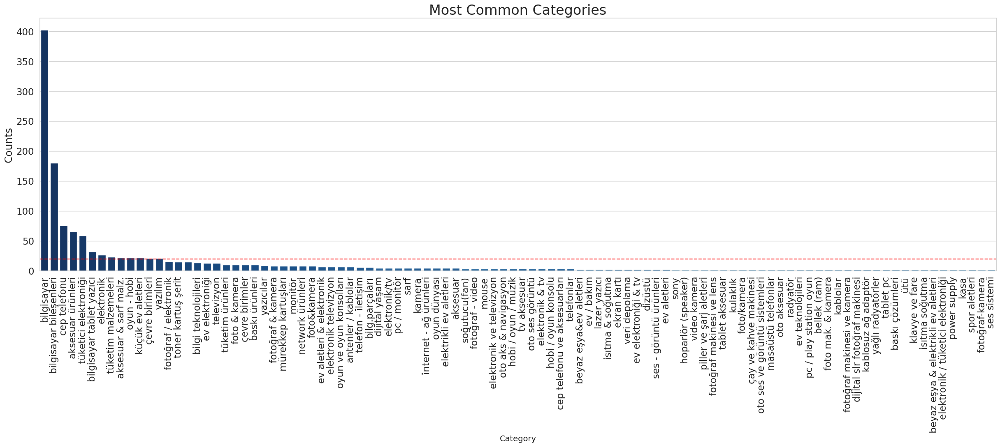

In [17]:
threshold = 20  # Trashold value

plt.figure(figsize=(30, 8))
sns.set(font_scale=1.5)
sns.set_style('whitegrid')

pal = sns.color_palette("Blues_r", len(bar_plot))
rank = bar_plot['count'].argsort().argsort()

sns.barplot(x=bar_plot['category'][:100], y=bar_plot['count'][:100], palette=np.array(pal[::-1])[rank])
plt.axhline(threshold, ls='--', c='red')
plt.title("Most Common Categories", fontsize=24)
plt.ylabel('Counts', fontsize=18)
plt.xlabel('Category', fontsize=14)
plt.xticks(rotation='vertical')
plt.show()


I want to chose trashold value as 20, because the categories with lower than 20 is very sprecific categories. Therefore, we can ignore them.

In [18]:
threshold = 20 

warnings.filterwarnings('ignore')

main_categories = pd.DataFrame()
main_categories = bar_plot[bar_plot['count']>threshold]
categories = main_categories['category'].values
categories = np.append(categories,'Others')
not_category = []
df2['Others'] = 0

for i in df2.columns[2:]:
    if i not in categories:
        df2['Others'][df2[i] == 1] = 1
        not_category.append(i)

df2.drop(not_category, axis=1, inplace=True)

df2.shape

(1482, 16)

We decrease the number of classes from 203 to 16. 

## Data Cleaning

### preprocess_tr library

This is my library for my preprocessing stage. 
Since I have created lots of subfolders for each version/model, I need to create a general library that I can use it for all of my model training notebook
One can find most of general preprocessing methods for text. I configire most of them for Turksih text content.


#### Remove Stop Words for Turkish

Let's create a funciton for removing stop words. Since our descriptions are Turkish, I use different library that finds Turkish stop words. 

Main source of list is: https://github.com/sgsinclair/trombone/blob/master/src/main/resources/org/voyanttools/trombone/keywords/stop.tr.turkish-lucene.txt

#### Keep Alpha

takes a sentence as input and returns a modified version of the sentence that only contains alphabetic characters.

#### Stemming for Turkish

In [19]:
import sys
sys.path.append('../')
from preprocess_tr import *

In [20]:
text = ["Mahkemenin","bu","kararında", "kadına","yönelik","şiddetin",
"toplumda","oluşturduğu","rahatsızlığın", "etkili","olduğu", "bilgisayarı"]

textt = "Merhabalar ben Alperen Ovak, Kendimi geliştirmeyi ve yeni şeyler öğrenmeyi severim"

text_zeyrek = []

In [21]:
remove_stop_words(textt)

'Merhabalar Alperen Ovak, Kendimi geliştirmeyi öğrenmeyi'

In [29]:
descrip = "STOKTAN AYNI GÜN TESLİM AYNI GÜN KARGO iPhone 6 yalnızca daha büyük değil, her açıdan daha gelişmiş. Daha büyük ve çok daha ince. Daha güçlü ve çok daha verimli. Kusursuz metal yüzeyi, yeni Retina HD ekranla mükemmel bir uyum içinde. Donanım ve yazılımın olağanüstü birlikteliği, kesintisiz bir form ve her anlamda daha üstün, yeni bir iPhone nesli yarattı. Yalnızca daha büyük bir ekran değil. Daha iyi bir ekran. iPhone 6 ve iPhone 6 Plus'ı gördüğünüzde ilk dikkatinizi çeken şey, daha yüksek çözünürlüklü yeni Retina HD ekranların boyutu olabilir. Ama deneyiminizin bunun çok daha ötesinde olacağı kesin. Daha yüksek kontrast sağlayan yenilikler, daha geniş görüntüleme açılarında bile daha gerçekçi renkler sunan, çift etki alanlı pikseller ve geliştirilmiş polarizör. Ve karşınızda şimdiye kadarki en ince ve en gelişmiş Multi‑Touch ekranlar. Büyük güç. Yüksek verimlilik. iPhone 6'da ikinci nesil 64 bit masaüstü sınıfı mimariye sahip A8 çip bulunur. M8 yardımcı hareket işlemcisi, aralarında yeni bir barometrenin de bulunduğu gelişmiş sensörleri sayesinde, hareketlerinizi etkili bir şekilde ölçerek bu olağanüstü gücü artırır. Daha iyi performans ve pil ömrü, iPhone 6’nızı daha uzun süre kullanmanızı ve çok daha fazla şey yapabilmenizi sağlar. Dünyanın fotoğrafa bakış açısı bu kamerayla değişti. Şimdi sıra videoda. iPhone ile her gün, diğer kameralardan daha çok fotoğraf çekiliyor. Çünkü, iSight kamera bu işi son derece kolay hale getiriyor. Ve dünyanın en popüler kamerası, 1.5 mikron piksel boyutunun ve ƒ/2.2 diyaframın yanı sıra herkesin harika fotoğraflar çekmesini sağlayacak yepyeni teknolojilerle donatıldı. Mükemmel videolar çekmeyi de kolay bir hale getirmek için; hızlandırılmış video modu, saniyede 60 kare 1080p HD video ve saniyede 240 kare ağır çekim video gibi yeni özellikler ekledik. Üstelik şimdi, çektiğiniz HD videoların muhteşem sonuçlarını geniş Retina HD ekranda izleyebilirsiniz. Güvenlik. Parmağınızın ucunda. Parmak iziniz, en güvenli parolanızdır. Çünkü her zaman yanınızdadır. Ve sadece size özeldir. Çığır açan Touch ID teknolojimiz, benzersiz bir parmak izi sensörü kullanarak telefonunuzun kilidini açmayı kolay ve güvenli hale getirdi. Üstelik iOS 8 ve Touch ID'deki yeni özellikler sayesinde, parmak izinizle şimdi çok daha fazlasına, daha hızlı erişebileceksiniz. iOS 8 Şimdiye kadarki en büyük iOS sürümü. Büyük olan yalnızca iPhone 6 değil. Dünyanın en gelişmiş mobil işletim sistemi de çıtasını yükseltti. iOS 8, örneğin sağlık ve spor uygulamalarını kullanarak doktorunuzla iletişim kurmak gibi, daha önce yalnızca hayal edebildiğiniz şeyleri yapmanızı sağlayan özellik ve işlevlere sahip. Şimdi geliştiriciler, iOS 8'in olağanüstü yeni özelliklerini uygulamalarına taşıyor. Çünkü daha derinlemesine erişimleri ve daha fazla araçları var. Ve bunların hepsi, büyük Retina HD ekranda muhteşem görünüyor."
descrip = lower(descrip)
descrip = clean_punctuation(descrip)
descrip = keep_alpha_turkish(descrip)
descrip = remove_stop_words(descrip)
descrip = stemming(descrip)
descrip

APPENDING RESULT: <(stok_Noun_1)(-)(stok:noun_S + a3sg_S + pnon_S + tan:abl_ST)>
APPENDING RESULT: <(stok_Noun)(-)(stok:noun_S + a3sg_S + pnon_S + tan:abl_ST)>
APPENDING RESULT: <(kargo_Noun)(-)(kargo:noun_S + a3sg_S + pnon_S + nom_ST)>
APPENDING RESULT: <(yüzey_Noun)(-)(yüzey:noun_S + a3sg_S + pnon_S + i:acc_ST)>
APPENDING RESULT: <(yüzey_Noun)(-)(yüzey:noun_S + a3sg_S + i:p3sg_S + nom_ST)>
APPENDING RESULT: <(retina_Noun)(-)(retina:noun_S + a3sg_S + pnon_S + nom_ST)>
APPENDING RESULT: <(Hd_Noun_Abbrv)(-)(hd:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>
APPENDING RESULT: <(ekran_Noun)(-)(ekran:noun_S + a3sg_S + pnon_S + la:ins_ST)>
APPENDING RESULT: <(donanım_Noun)(-)(donanım:noun_S + a3sg_S + pnon_S + nom_ST)>
APPENDING RESULT: <(donmak_Verb)(-)(don:verbRoot_S + an:vPresPart_S + noun_S + a3sg_S + ım:p1sg_S + nom_ST)>
APPENDING RESULT: <(donmak_Verb)(-)(don:verbRoot_S + an:vPresPart_S + noun_S + a3sg_S + pnon_S + nom_ST + nounZeroDeriv_S + nVerb_S + nPresent_S + ım:nA1sg_ST)>
APPENDING RES

'stok kargo yüzey retina Hd ekran donanım yazılı birliktelik form Nes plusı görmek dikkat çözünürlük retina Hd ekran deneyim kontrast yenilik görüntülemek açı renklemek alan pik geliştirmek polarizör karşı Kadarki multitouch ekran verim bit masaüstü mimarî çip işlem barometre sensör hareket ölçmek artırmak pil nızı kul yapmak fotoğraf kamera video kamera çekmek isight kamera mikron pik boyut diyafram çekmek teknoloji donamak video çekmek hızlanmak mod Hd eklemek çekmek Hd video retina Hd ekran izlemek parmak iz parola yan özel çığırmak Touch Id teknoloji benzer sensör telefon kilit açma ios Touch Id iz fazla erişmek ios Kadarki ios sürüm çıta yükselmek ios uygulamak doktor etmek yapmak işlev geliştirmek ios uygulamak derinlemek erişim retina Hd ekran'

In [30]:
# Applying data cleaning on description to ignore irrelevant words
df2['description'] = df2['description'].apply(lower)
df2['description'] = df2['description'].apply(clean_punctuation)
df2['description'] = df2['description'].apply(keep_alpha_turkish)
df2['description'] = df2['description'].apply(remove_stop_words)
df2['description'] = df2['description'].apply(stemming)

df2.head()

APPENDING RESULT: <(Hp_Noun_Abbrv)(-)(hp:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>
APPENDING RESULT: <(Pavilion_Noun_Prop)(-)(pavilion:nounProper_S + a3sg_S + pnon_S + nom_ST)>
APPENDING RESULT: <(Pentium_Noun_Prop)(-)(pentium:nounProper_S + a3sg_S + pnon_S + nom_ST)>
APPENDING RESULT: <(Gb_Noun_Abbrv)(-)(gb:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>
APPENDING RESULT: <(gb_Noun)(-)(gb:noun_S + a3sg_S + pnon_S + nom_ST)>
APPENDING RESULT: <(Gb_Noun_Abbrv)(-)(gb:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>
APPENDING RESULT: <(gb_Noun)(-)(gb:noun_S + a3sg_S + pnon_S + nom_ST)>
APPENDING RESULT: <(dokunmatik_Adj)(-)(dokunmatik:adjectiveRoot_ST)>
APPENDING RESULT: <(Win_Noun_Abbrv)(-)(win:nounAbbrv_S + a3sg_S + pnon_S + nom_ST)>
APPENDING RESULT: <(detay_Noun)(-)(detay:noun_S + a3sg_S + pnon_S + nom_ST)>
APPENDING RESULT: <(işlemci_Noun)(-)(işlemci:noun_S + a3sg_S + pnon_S + nom_ST)>
APPENDING RESULT: <(işlem_Noun)(-)(işlem:noun_S + a3sg_S + pnon_S + nom_ST + ci:agt_S + noun_S + a3sg_S + pnon_S + 

In [25]:
#df2.to_csv('cleaned_data.csv', index=False)

In [25]:
df2 = pd.read_csv('../cleaned_data.csv')
df2.head()
df2 = df2.dropna()


In [27]:
# Ensure the description column is treated as strings
df2["description"] = df2["description"].astype(str)

# Display all elements in the description column
for description in df2["description"]:
    print(description)

hp pavilion  nnt pentium n gb gb   dokunmatik win kwea detay bilgisi işletim sistemi windows işlemci ailesi intel pentium işlemciişlemci intel pentium n intel hd graphics ile   ghz  mb önbellek  çekirdekli bellek gb  mhz ddrl sdramdahili sürücü  gb  rpm sataekran   cm   inç diyagonal boyutlu hd led arkadan aydınlatmalı dokunmatik ekran  x  grafik intel hd graphicsbağlantı noktaları hdmi usb   usb   rj ses özellikleri  hoparlörlü beats audioağ arabirimitümleşik   base t ethernet lankablosuz b g n x ve bluetooth   birleşimi miracast uyumlu güç kaynağı türü  w ac güç adaptörüpil tipi  hücreli  wh prizmatikenerji verimliliğienergy star belgeliepeat silver
stoktan ayni gün teslim ayni gün kargo iphone  yalnızca daha büyük değil her açıdan daha gelişmiş daha büyük ve çok daha ince daha güçlü ve çok daha verimli kusursuz metal yüzeyi yeni retina hd ekranla mükemmel bir uyum içinde donanım ve yazılımın olağanüstü birlikteliği kesintisiz bir form ve her anlamda daha üstün yeni bir iphone nesli 

## Model Training

In [28]:

X_train, X_test, y_train, y_test = train_test_split(df2['description'], 
                                                    df2[df2.columns[2:-1]], 
                                                    test_size=0.3, 
                                                    random_state=0, 
                                                    shuffle=True)

In [29]:
X_train

587     2000-2400W Kablo muhafaza bölümü Otomatik kont...
1444    <!-- Yazı Kopyalama Koruma --> <!-- oncontextm...
773                                             PC DIRT 2
1279    Powersupply Gücü 550W Garanti Süresi 24 Ay Sip...
557     Cooler Master Vortex Plus İntel Lga 775/1155/1...
                              ...                        
763     -iki ucu erkek scart altın uçlu kılıflı kablo-...
835     Ürün Kodu : 16631045098 uyumlu_urunler :•Canon...
1216    Özellikler Arabirim USB 3.0 Uyumluluk Tüm 2.5 ...
559     Düşük Enstantene seçimlerinde uzun pozlama ger...
684     Telefonunuzu dış etkenlerden maximum düzeyde k...
Name: description, Length: 1037, dtype: object

In [30]:
vectorizer = TfidfVectorizer(strip_accents='unicode', analyzer='word', ngram_range=(1,3), norm='l2') # Using a tf-idf weighting scheme rather than normal boolean weights for better performance
vectorizer.fit(X_train) # Reference : https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html

X_train = vectorizer.transform(X_train)
X_test = vectorizer.transform(X_test)

In [31]:
print("X_train shape : ",X_train.shape)
print("X_test shape : ",X_test.shape)

X_train shape :  (1037, 214461)
X_test shape :  (445, 214461)


In [32]:
description = "HP Pavilion 11-n000nt Pentium N3540 4GB 750GB 11.6\" Dokunmatik Win8 - K0W08EA Detay Bilgisi İşletim sistemi : Windows 8İşlemci ailesi : Intel® Pentium® işlemciİşlemci : Intel® Pentium® N3540 Intel HD Graphics ile (2.16 GHz, 2 MB önbellek, 4 çekirdekli)Bellek: 4GB 1600 MHz DDR3L SDRAMDahili sürücü : 750 GB 5400 rpm SATAEkran : 29,5 cm (11,6 inç) diyagonal boyutlu HD LED arkadan aydınlatmalı dokunmatik ekran (1366 x 768)Grafik : Intel HD GraphicsBağlantı Noktaları1 HDMI1 USB 2.01 USB 3.01 RJ-45Ses özellikleri: 2 hoparlörlü Beats Audio™Ağ arabirimiTümleşik 10/100 BASE-T Ethernet LANKablosuz802.11b/g/n (1x1) ve Bluetooth® 4.0 birleşimi (Miracast uyumlu)Güç kaynağı türü: 45 W AC güç adaptörüPil tipi : 2 hücreli, 29 WH prizmatikEnerji verimliliğiENERGY STAR® belgeliEPEAT® Silver"

In [33]:
LR_pipeline = Pipeline([('clf', OneVsRestClassifier(LogisticRegression(solver='sag'), n_jobs=-1))]) 
# one-vs-all, this strategy consists in fitting one classifier per class. For each classifier, the class is fitted against all the other classes. In addition to its computational efficiency (only n_classes classifiers are needed), one advantage of this approach is its interpretability. Since each class is represented by one and one classifier only, it is possible to gain knowledge about the class by inspecting its corresponding classifier. This is the most commonly used strategy for multiclass classification and is a fair default choice.
# Reference : https://scikit-learn.org/stable/modules/generated/sklearn.multiclass.OneVsRestClassifier.html

# sag : Algorithm to use in the optimization problem, "saga’ also supports "elasticnet’ penalty  Reference : https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html
# n_jobs : The number of jobs to use for the computation: the n_classes one-vs-rest problems are computed in parallel. Reference : https://scikit-learn.org/stable/modules/generated/sklearn.multiclass.OneVsRestClassifier.html
# clf : name given to the Pipeline

accuracy = 0
auc = 0
modelNumber = 1
for category in df2.columns[2:-1]:    
    LR_pipeline.fit(X_train, y_train[category]) # Training logistic regression model on train data
    prediction = LR_pipeline.predict(X_test)    # calculating predictions
    acc = accuracy_score(y_test[category], prediction)
    au = roc_auc_score(y_test[category],prediction)
    accuracy = accuracy + acc
    auc = auc + au
    print('CATEGORY => {} '.format(category),'AUC ROC score => {}'.format(au)," Accuracy => {}".format(acc))
    print(LR_pipeline.predict(X_test)) 
    filename = str(modelNumber)+"_model.sav"
    joblib.dump(LR_pipeline, filename)          # saving individual classifiers for later use
    modelNumber += 1
print("-------------------------------------------------------------------------------------------------------------------------------")
print('Test averaged Accuracy => {}'.format(accuracy/len(df2.columns[2:-1])))
print('Test averaged AUC ROC Score => {}'.format(auc/len(df2.columns[2:-1])))

CATEGORY => bilgisayar  AUC ROC score => 0.620383124171003  Accuracy => 0.7865168539325843
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 1 1 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 1 0 0 0 0 1 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0 0
 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0
 0]
CATEG

KeyboardInterrupt: 

As you can see above, when we imply binary classificaiton for each class by using *he one-vs-rest method* we got total 0.97 accuracy. 

In [33]:
# Api for category prediction
def categoryPrediction(description):
  
  description = description.lower()
  description = cleanPunc(description)
  description = removeStopWords(description)
  #description = stemming(description)

  information = description  # creating information text
  X_api = vectorizer.transform([information]) # transforming using already trained vectorizing transformer

  # LR_pipeline = Pipeline([('clf', OneVsRestClassifier(LogisticRegression(solver='sag'), n_jobs=-1))])
  accuracy = 0
  modelNumber = 1
  for category in df2.columns[2:-1]:
    # LR_pipeline.fit(X_train, y_train[category])
    filename = str(modelNumber)+"_model.sav"
    modelNumber += 1
    LR_pipeline = joblib.load(filename) # loading already saved model

    # calculating test accuracy
    prediction = LR_pipeline.predict(X_api)
    if prediction > 0.5:
      print('CATEGORY {}'.format(category)) # if models predicts true print that category
     

In [34]:
description = "TEFAL GV 8930 PRO EXPRESS TOTAL AUTO CONTROL 3 AYARLI BUHAR JENERATÖRLÜ ÜTÜ 6 bar buhar basıncı 120 g/dk buhar gücü 310 g/dk şok buhar 3 ısı/buhar ayarı 1.8 lt su tank kapasitesi Çıkarılabilir su tankı Sürekli dolum Autoclean taban Kordon saklama bölmesi Kilit sistemi Comfort"
b = cleanPunc(description)
c = keepAlphaTurkish(b)
d = removeStopWords(c)
e = stemming(d)
categoryPrediction(description)

In [34]:
df2.columns[2]

'bilgisayar'

In [35]:
from keras_preprocessing.text import Tokenizer


from keras_preprocessing.sequence import pad_sequences




In [36]:
df2['description']

0       HP Pavilion 11-n000nt Pentium N3540 4GB 750GB ...
1       STOKTAN AYNI GÜN TESLİM AYNI GÜN KARGO iPhone ...
2       Ağırlık (Gr.) 115 Boyut (mm.) 132.4 x 65.5 x 6...
3       ÖZELLİKLER Ekran Ekran Boyutu 48" Ekran Boyutu...
4       Ürün Kodu : 40061255166 Genel Özellikler Panel...
                              ...                        
1477          Powersupply Gücü :550WGaranti Süresi :24 Ay
1478    Baskı Rengi :MaviYazdırma Teknolojisi :LaserBa...
1479    Baskı Rengi :KırmızıYazdırma Teknolojisi :Lase...
1480    Disk Kapasite Aralığı :2 TB - 4 TBGaranti Süre...
1481    Dahili / Harici :DahiliDisk Kapasite Aralığı :...
Name: description, Length: 1482, dtype: object

In [37]:

tokenizer = Tokenizer(num_words=5000, lower=True) # lower : boolean. Whether to convert the texts to lowercase. , num_words : the maximum number of words to keep, based on word frequency.
tokenizer.fit_on_texts(df2['description']) # encoding words of information to integers, Updates internal vocabulary based on a list of sequences.
sequences = tokenizer.texts_to_sequences(df2['description'])
x = pad_sequences(sequences, maxlen=500) # provide tagging to make each sequence of length 500

In [38]:
x.shape

(1482, 500)

In [39]:
# Splitting dataset in train/test set
X_train, X_test, y_train, y_test = train_test_split(x, df2[df2.columns[2:-1]], 
                                                    test_size=0.3, 
                                                    random_state=0)

In [40]:
bar_plot['class_weight'] = len(bar_plot) / bar_plot['count']
class_weight = {}    
bar_plot.head()

NameError: name 'bar_plot' is not defined

In [61]:
classes # categories in which our results will belong to
     

['bilgisayar',
 'cep telefonu',
 'bilgisayar bileşenleri',
 'küçük ev aletleri',
 'çevre birimleri',
 'tüketici elektroniği',
 'yazılım',
 'elektronik',
 'oyun - hobi',
 'aksesuar ürünleri',
 'tüketim malzemeleri',
 'aksesuar & sarf malz.',
 'bilgisayar tablet yazıcı']

In [42]:
num_classes = y_train.shape[1]
max_words = len(tokenizer.word_index) + 1
maxlen = 500

In [60]:
y_train

,bilgisayar,cep telefonu,bilgisayar bileşenleri,küçük ev aletleri,çevre birimleri,tüketici elektroniği,yazılım,elektronik,oyun - hobi,aksesuar ürünleri,tüketim malzemeleri,aksesuar & sarf malz.,bilgisayar tablet yazıcı
587,0,0,0,0,0,0,0,0,0,0,0,0,0
1444,0,0,0,0,0,0,0,0,0,0,0,0,1
773,0,0,0,0,0,0,1,0,0,0,0,0,0
1279,0,0,1,0,0,0,0,0,0,0,0,0,0
557,0,0,1,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
763,0,0,1,0,0,0,0,0,0,0,0,0,0
835,1,0,0,0,0,0,0,0,0,0,0,0,0
1216,0,0,1,0,0,0,0,0,0,0,0,0,0
559,0,0,0,0,0,0,0,0,0,0,0,0,0


In [44]:
max_words # max words/ total vocab + 1 

27035

In [62]:
from keras.models import load_model
from keras.models import Sequential
from keras.layers import Dense, Embedding, GlobalMaxPool1D, Dropout
from tensorflow.keras.optimizers import Adam
from keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
import tensorflow as tf
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Embedding, Dense, GlobalMaxPool1D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint


# Create the model
model = Sequential(name="model-neural-net")
model.add(Embedding(input_dim=max_words, output_dim=300, input_length=maxlen))
model.add(Dense(300, activation='relu'))
model.add(GlobalMaxPool1D())
model.add(Dense(num_classes, activation='sigmoid'))

model.build
# Compile the model
model.compile(optimizer=Adam(0.0005), loss='binary_crossentropy', metrics=[tf.keras.metrics.AUC()])

# Define callbacks
callbacks = [
    ReduceLROnPlateau(),  # Reduce learning rate on plateau
    ModelCheckpoint(filepath='model-neural-net.keras', save_best_only=True)
]
model.build()
model.summary()


Model: "model-neural-net"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_7 (Embedding)         │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling1d_7          │ ?                      │   0 (unbuilt) │
│ (GlobalMaxPooling1D)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

In [75]:
# Save the model to a file
model.save('model-neural-net.keras')

In [46]:
import tensorflow as tf

In [47]:
#model_path = os.path.join(os.path.dirname(__file__), "model-neural-net.keras")
model = tf.keras.models.load_model("model-neural-net.keras")

In [48]:

from tensorflow.keras.utils import plot_model
plot_model(model, to_file='model_nn_plot.png', show_shapes=True, show_layer_names=True)

You must install pydot (`pip install pydot`) for `plot_model` to work.


In [49]:
history = model.fit(X_train, y_train,
                    class_weight=class_weight,
                    epochs=30,
                    batch_size=32,
                    validation_split=0.3,
                    callbacks=callbacks)

NameError: name 'class_weight' is not defined

As we can see, our model overfit because of the dataset. 


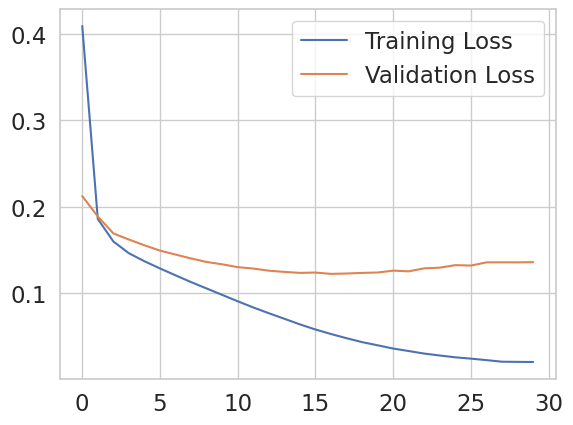

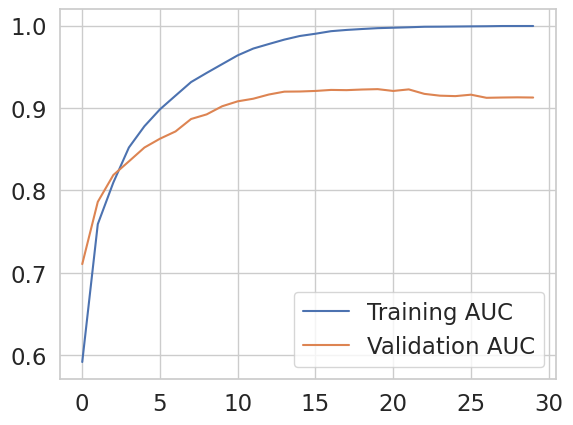

In [65]:
# Plotting losses wrt epochs(time)
plt.plot(history.history["loss"], label="Training Loss") 
plt.plot(history.history["val_loss"], label="Validation Loss")
plt.legend()
plt.show()
# Plotting accuracy wrt epochs(time)
plt.plot(history.history["auc_7"], label="Training AUC")
plt.plot(history.history["val_auc_7"], label="Validation AUC")
plt.legend()
plt.show()

In [66]:
metrics = model.evaluate(X_test, y_test)
print("{}: {}".format(model.metrics_names[1], metrics[1]))

14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - auc_7: 0.8978 - loss: 0.1521
compile_metrics: 0.9029563665390015


In [52]:
classes = [col for col in df2.columns]
classes = classes[2:-1]
classes
     

['bilgisayar',
 'cep telefonu',
 'bilgisayar bileşenleri',
 'küçük ev aletleri',
 'çevre birimleri',
 'tüketici elektroniği',
 'yazılım',
 'elektronik',
 'oyun - hobi',
 'aksesuar ürünleri',
 'tüketim malzemeleri',
 'aksesuar & sarf malz.',
 'bilgisayar tablet yazıcı']

In [53]:
import operator

# Utility function to get predictions using Neural Net model
def categoryPredictionNN(description):
    
    description = description.lower()
    description = cleanPunc(description)
    description = keepAlphaTurkish(description)
    description = removeStopWords(description)
    description = stemming(description)

    information = description

    sequences = tokenizer.texts_to_sequences([information])
    x = pad_sequences(sequences, maxlen=500)
    prediction = model.predict(x)

    predScores = [score for pred in prediction for score in pred]
    predDict = {}
    for cla, score in zip(classes, predScores):
        predDict[cla] = score

    sortedPredictions = sorted(predDict.items(), key=operator.itemgetter(1), reverse=True)[:10]
    return sortedPredictions

In [66]:
description = "Chipset Intel SoC Platform İşlemci Çekirdek Sayısı 2 İşlemci Sayısı 1 Turbo İşlemci Hızı 2.8 İşlemci Hızı 2.8 İşlemci Markası Intel® İşlemci Intel Celeron İşlemci Modeli Celeron® RAM Tipi DDR4 Maks. Desteklenen Bellek 4 RAM Bellek Boyutu 4 Ekran Boyutu (inç) 15.6 Çözünürlük 1366x768 Ekran Boyutu 39.624 cm / 15.6 inç Görüntü Oranı 04:03 Görüntü kalitesi Full-HD Ekran Tipi TN Ekran boyutu(cm) 39.624 Ekran Özellikleri 220nits Anti-glare Grafik Kartı UHD 600 Grafik Bellek Tipi shared-memory Paylaşımlı Grafik Bellek Paylaşımlı Gb Cinsinden Toplam Depolama Alanı 128 Sabit disk kapasitesi 128 Sabit disk tipi SSD Hard disk 1 SSD , 128 GB SSD Evet Sürücü Hayır Ağ Evet WİFİ Evet Bluetooth Evet Bağlantılar Wi-Fi, Bluetooth, Usb Ses Kartı High Definition (HD) Audio Mikrofon Evet İşletim Sistemi İçin Ek Bilgiler Windows 11 Home Ön Kamera Evet Batarya kapasitesi 42 Batarya Ömrü 11 Yükseklik (maks.) 17.9 Üretici Garantisi 2 Yıl Resmi Distribütör Garantilidir Ürün Tipi Laptop Renk (Üreticiye Göre) Gri Ağırlık 1.54 Derinlik 236 Yükseklik 17.9 Boyutlar (GxYxD) / Ağırlık 360.2 mm x 17.9 mm x 236 mm / - Ambalajlı Ağırlık 2.38 Genişlik 360.2 Ambalaj Genişliği 533 Ambalaj Yüksekliği 74 Ambalaj Derinliği 333 Çevre Ölçüsü 134.7 cm Kutu İçeriği Notebook, Güç Adaptörü Ambalaj Boyutu 533 mm / 74 mm / 333 mm Üretim Yeri Çin Grafik Kart Üreticisi:Intel Ekran kartı:UHD Graphics 600"
text1 ="iPhone 6 - iPhone 6 Plus Cep Telefonu Genel Özellikleri iPhone 6 yalnızca daha büyük değil, her açıdan daha gelişmiş. Daha büyük ve çok daha ince. Daha güçlü ve çok daha verimli. Kusursuz metal yüzeyi, yeni Retina HD ekranla mükemmel bir uyum içinde. Donanım ve yazılımın olağanüstü birlikteliği, kesintisiz bir form ve her anlamda daha üstün, yeni bir iPhone nesli yarattı. Şimdiye kadarki en büyük iPhone ve en ince iPhone 6'yı tasarlarken her malzemeyi ve unsuru en ince ayrıntısına kadar inceledik. Yumuşak hatlı ve kesintisiz bir tasarıma bu şekilde ulaştık. Şimdiye kadarki en ince ekranımız sayesinde form da inceldi. Düğmeler, kolay kullanmanız için en iyi şekilde yerleştirildi. Anodize alüminyum, paslanmaz çelik ve cam, kusursuz bir şekilde bir araya geldi. Sonuçta binlerce küçük ayrıntının birleşmesiyle, ortaya büyük bir şey çıktı. Hatta, iki büyük şey: iPhone 6 ve iPhone 6 Plus. Yalnızca daha büyük bir ekran değil,daha iyi bir ekran iPhone 6 ve iPhone 6 Plus'ı gördüğünüzde ilk dikkatinizi çeken şey, daha yüksek çözünürlüklü yeni Retina HD ekranların boyutu olabilir. Ama deneyiminizin bunun çok daha ötesinde olacağı kesin. Daha yüksek kontrast sağlayan yenilikler, daha geniş görüntüleme açılarında bile daha gerçekçi renkler sunan, çift etki alanlı pikseller ve geliştirilmiş polarizör. Ve karşınızda şimdiye kadarki en ince ve en gelişmiş Multi‑Touch ekranlar. Büyük güç ve yüksek verimlilik iPhone 6'da ikinci nesil 64 bit masaüstü sınıfı mimariye sahip A8 çip bulunur. M8 yardımcı hareket işlemcisi, aralarında yeni bir barometrenin de bulunduğu gelişmiş sensörleri sayesinde, hareketlerinizi etkili bir şekilde ölçerek bu olağanüstü gücü artırır. Daha iyi performans ve pil ömrü, iPhone 6’nızı daha uzun süre kullanmanızı ve çok daha fazla şey yapabilmenizi sağlar. Dünyanın fotoğrafa bakış açısı bu kamerayla değişti,şimdi sıra videoda iPhone ile her gün, diğer kameralardan daha çok fotoğraf çekiliyor. Çünkü, iSight kamera bu işi son derece kolay hale getiriyor. Ve dünyanın en popüler kamerası, 1.5 mikron piksel boyutunun ve ƒ/2.2 diyaframın yanı sıra herkesin harika fotoğraflar çekmesini sağlayacak yepyeni teknolojilerle donatıldı. Mükemmel videolar çekmeyi de kolay bir hale getirmek için; hızlandırılmış video modu, saniyede 60 kare 1080p HD video ve saniyede 240 kare ağır çekim video gibi yeni özellikler ekledik. Üstelik şimdi, çektiğiniz HD videoların muhteşem sonuçlarını geniş Retina HD ekranda izleyebilirsiniz. Daha hızlı kablosuz bağlantı daha fazla yerde Tüm dünya elinizin altındaymış gibi hissettiren süper hızlı bağlantı, iPhone 6’nın daha yüksek indirme hızlarına1 ulaşmasını ve tüm dünyadaki ağlara bağlanmasını sağlar. Ayrıca daha gelişmiş kablosuz teknolojileri destekleyerek performansı artırır ve sizin için önemli olan şeylerle ve kişilerle bağlantı kurabilmenize yardımcı olur. Güvenlik Parmağınızın ucunda Parmak iziniz, en güvenli parolanızdır. Çünkü her zaman yanınızdadır. Ve sadece size özeldir. Çığır açan Touch ID teknolojimiz, benzersiz bir parmak izi sensörü kullanarak telefonunuzun kilidini açmayı kolay ve güvenli hale getirdi. Üstelik iOS 8 ve Touch ID'deki yeni özellikler sayesinde, parmak izinizle şimdi çok daha fazlasına, daha hızlı erişebileceksiniz. Şimdiye kadarki en büyük iOS sürümü Büyük olan yalnızca iPhone 6 değil. Dünyanın en gelişmiş mobil işletim sistemi de çıtasını yükseltti. iOS 8, örneğin sağlık ve spor uygulamalarını kullanarak doktorunuzla iletişim kurmak gibi, daha önce yalnızca hayal edebildiğiniz şeyleri yapmanızı sağlayan özellik ve işlevlere sahip. Şimdi geliştiriciler, iOS 8'in olağanüstü yeni özelliklerini uygulamalarına taşıyor. Çünkü daha derinlemesine erişimleri ve daha fazla araçları var. Ve bunların hepsi, büyük Retina HD ekranda muhteşem görünüyor. Apple iPhone 6 Plus 16GB Uzay Gri Cep Telefonu (MGA82TU/A) Özellikleri RenkUzay Gri Dokunmatik EkranVar Ekran TipiIPS Led Ekran Ekran Çözünürlüğü1920 x 1080 Piksel Ekran Boyutu5.5 İşletim SistemiiOS 8 İşlemciA8 İşlemci Görüntülü GörüşmeVar 3G (Bağlantı Hızı)Var Dahili Hafıza16 Gb Arttırılabilir HafızaYok Wi-FiVar Çift HatYok Kamera8 Megapixel Kamera ZoomVar Kamera FlaşVar Video KayıtVar MesajVar Email desteğiVar GPS VAR GprsVar EdgeVar WapVar Bluetooth ÖzelliğiVar Radyo (FM)Yok Mp3Var TitreşimVar Bas KonuşVar AjandaVar AlarmVar Hesap MakinesiVar Boyutlar158,1 x 77,8 x 7,1 mm Ağırlık172 Gr Kutu İçeriğiCep Telefonu, Batarya, Şarj Aleti, Kablolu Kulaklık Garanti Süresi24 Ay APPLE TÜRKİYE tarafından garantilidir. Apple iPhone 6 Plus 16GB Uzay Gri Cep Telefonu (MGA82TU/A) Resimleri Ürüne resim ekleyin 0.10 TL değerinde incepuan kazanın! Apple iPhone 6 Plus 16GB Uzay Gri Cep Telefonu (MGA82TU/A) Fiyatları ve Ödeme Seçenekleri TaksitTaksit TutarıToplam Tutar 3 910,66 TL 2.732,00 TL 6 455,33 TL 2.732,00 TL 9 303,56 TL 2.732,00 TL TaksitTaksit TutarıToplam Tutar 2+4 455,33 TL 2.732,00 TL 3+4 390,28 TL 2.732,00 TL 9 309,63 TL 2.786,63 TL TaksitTaksit TutarıToplam Tutar 3 910,66 TL 2.732,00 TL 5 551,86 TL 2.759,32 TL 9 312,66 TL 2.813,95 TL TaksitTaksit TutarıToplam Tutar 3 910,66 TL 2.732,00 TL 6 459,89 TL 2.759,32 TL 9 306,59 TL 2.759,32 TL TaksitTaksit TutarıToplam Tutar 3 910,66 TL 2.732,00 TL 6 459,89 TL 2.759,32 TL 9 312,66 TL 2.813,95 TL TaksitTaksit TutarıToplam Tutar 3 910,66 TL 2.732,00 TL 6 455,33 TL 2.732,00 TL 9 303,56 TL 2.732,00 TL Kredi Kartı Tek Çekim %2 İNDİRİM2.677,36 TL Banka Havalesi / EFT ile %3 İNDİRİM2.650,04 TL Apple iPhone 6 Plus 16GB Uzay Gri Cep Telefonu (MGA82TU/A) ile en çok karşılaştırılan ürünler %23 Lg G3 D855 32 Gb Beyaz Cep Telefonu %23 Sony Xperia Z2 Beyaz Cep Telefonu %22 Samsung N9000Q Galaxy Note 3 Beyaz Cep Telefonu %19 Lg G3 D855 16 Gb Titan Cep Telefonu %13 Samsung Galaxy G900H S5 16 Gb Siyah Cep Telefonu Seçili Ürünleri Karşılaştır Neden incehesap.com ? Binlerce müşterimizin bilgisayar ve elektronik ürün ihtiyaçlarını bizden temin ediyor olması; küçük, orta ve büyük ölçekli işletmelerden bireysel müşterilere kadar geniş bir satış ağımızın olması, en uygun fiyatları siz değerli müşterilerimize sunmamız, alanında uzmanlaşmış kadro, hızlı sevkiyat, uygun ödeme seçenekleri ve güvenli alışveriş imkanı gibi birçok sebepten dolayı biz, tercih edebileceğiniz en iyi ve güvenilir online satış sitelerinden birisiyiz. Türkiye’nin önde gelen distribütörlerinin bizim için ne söylediklerini görmek için tıklayınız.LojistikMümkün olan en kısa sürede; yani birçok üründe siparişlerinizin aynı gününde teminini gerçekleştiriyor ve siparişlerinizi size gönderilmek üzere kargoya veriyoruz. Adetli ürün teminlerini de hızlı bir şekilde gerçekleştirebiliyoruz. Bunun yanı sıra hâlihazırda onbinlerce ürünü de kendi stoğumuzda bulunduruyoruz, bundan dolayı siparişlerinizi en hızlı ve güvenilir şekilde teslim eden firmalardan biri de biziz.Müşteri Hizmetleri Konusunda uzman bir kadroya sahip olan müşteri temsilcisi arkadaşlarımız sayesinde, ürünler ile ilgili bilgilere, talepleriniz ile ilgili cevaplara ve daha birçok konuda yardıma online veya telefon ile ulaşabilir, destek alabilirsiniz. Alacağınız ya da aldığınız ürünler ile ilgili her tür bilgiyi sunar, sadece sorularınızı cevaplamaz ayrıca bütçenize de en uygun ürünleri öneririz.Fiyat AvantajıDeneyimli satın alma ekibimiz size en uygun fiyatları verebilmek için her hafta binlerce farklı fiyatı kontrol ediyor. Eğer aynı ürünlerde bizim fiyatlarımızdan daha ucuzunu bulur, ürünü satın almadan önce bize bildirirseniz ilgili ürünün fiyatını da satabileceğimiz en düşük fiyata indiririz. ( Bu fiyatları bize bildirmek için [email protected] 'a mail atabilir, yada Müşteri Hizmetleri sayfamızdan iletişime geçebilirsiniz. )Ürün DanışmanıSize, alışverişinizi kolaylaştırmanız için çeşitli ürünlerde hizmete sunulmuş online danışmandır. Biz bu danışmanı sadece satış yapmak için değil memnun müşteri yaratmak için de oluşturduk. Ürünler ile ilgili çok az bilgiye sahip olsanız bile, Ürün Danışman’ımız sayesinde kolaylıkla ihtiyacınıza uygun ürünü bulabilirsiniz. Ürün Danışman’ını kullanmak tamamen ücretsiz olup, üstelik ürünü bizden alma zorunluluğu bulunmamaktadır. Ürün Danışman’ına ulaşmak için lütfen tıklayınız.Hem distribütör hem de tüketici gözüyle bakarızSadece çok iyi bir satış sitesi değil aynı zamanda en çok satılan birkaç ürünün Türkiye distribütörü ve birçok markanın da dağıtıcısıyız. Müşteri memnuniyetinin ürün kalitesinden çok daha önemli olduğunu biliyor ve bütün gücümüzü taleplerinizi karşılamak ve beklentilerinizi aşmak yönünde harcıyoruz.Keyifli alışverişler..."
evAleti = "Arzum ütü, 1. sınıf kaliteli malzemelerden imal edilerek yüksek verimlilik ve dayanıklılık sunar. Dikey buharlı ütü, damlama önleme özelliği sayesinde memnuniyet sağlar. Seramik tabanlı ütü, geleneksel modellerin yanı sıra kumaşları sararma ve lekelenmelere karşı korur. Arzum AR688 Claro seramik tabanlı ütü, uzun süreli kullanımda ağırlık hissini ortadan kaldırarak ergonomi sunar. 2400 W buharlı ütü, yüksek ısı teknolojisi sayesinde farklı kumaş türleri üzerinde etkilidir. Dikey şekilde kullanılabilen ütü modeli, asılı duran eşyalar için işlevsellik sağlar. Şok buhar kazanlı ütü, kırışıkları üst seviye ısı performansı sayesinde kısa sürede giderir. Kireç önleme teknolojisi ile geliştirilen Arzum AR688 Claro, ihtiyacınızı uzun yıllar karşılar. Sürekli buhar veren ütü sayesinde uzun süreli işlem gerektiren kumaşlarda bile kısa sürede ideal sonuçlar elde edebilirsiniz."
iphone ="Son teknolojiyle üretilen iPhone 13, ultra geniş 12 MP iki ana kamera ve 12 MP ön kamerayla profesyonel fotoğraflama ve video imkanı sunarken, sinematik mod kamera özelliğiyle derinlik efekti ve odak geçişi yapar. Geniş hacimli 128 GB kapasitesiyle fotoğraf, video ve uygulamalarınızı rahatlıkla depolar. Her anın vazgeçilmez aksesuarı siyah telefonlar, tarzınıza uyacak şekilde tasarlanmıştır. Dayanıklı tasarıma sahip Apple iPhone 13, havacılık ve uzay endüstrisi standartlarında bir malzeme olan alüminyum kenarlardan oluşur. Geniş kapsama alanı sunan 5G telefonlar, hızlı ve kesintisiz iletişim hizmeti sağlar. Kablosuz şarj olan telefonlar, aynı zamanda uzun pil kullanımı sağlayan yüksek teknolojiden oluşur. Modern çizgileriyle Apple iPhone 13, 128 GB suya ve toza dayanıklı olacak şekilde üretilmiştir. İşlevsel ve kompakt bir sistemden oluşan iOS telefonlar, farklı ihtiyaçlara uygun uygulama çeşitliliği yaratır. 4 GB RAM'e sahip telefon, 60 Hz ekran yenileme hızıyla kolay kullanım sağlar. 6.1 inç Super Retina XDR geniş ve ultra çözünürlüklü ekran ile üst düzey deneyim sunar. Üst düzey teknolojinin ürünü olan OLED ekran, parlak, net ve canlı renkleriyle kullanışlıdır. Akıllı performans özelliğine sahip NFC cep telefonu, kişisel güvenlik alanı oluşturur."
prediction = categoryPredictionNN(iphone)
prediction

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


[('cep telefonu', 0.08458516),
 ('bilgisayar', 0.0639721),
 ('aksesuar ürünleri', 0.049926568),
 ('bilgisayar bileşenleri', 0.032637157),
 ('tüketici elektroniği', 0.027994284),
 ('yazılım', 0.014933508),
 ('küçük ev aletleri', 0.013951014),
 ('elektronik', 0.013897458),
 ('oyun - hobi', 0.0095538795),
 ('aksesuar & sarf malz.', 0.008539036)]

In [60]:
from keras.layers import Dense, Activation, Embedding, Flatten, GlobalMaxPool1D, Dropout, Conv1D


class CustomModel(Model):
    def __init__(self, max_words, maxlen, num_classes):
        super(CustomModel, self).__init__()
        self.embedding = Embedding(max_words, 300, input_length=maxlen)
        self.dropout1 = Dropout(0.2)
        self.conv1d = Conv1D(300, 3, padding='valid', activation='relu', strides=1)
        self.global_maxpool = GlobalMaxPool1D()
        self.dropout2 = Dropout(0.2)
        self.dense = Dense(num_classes)
        self.activation = Activation('sigmoid')
        
    def call(self, inputs):
        x = self.embedding(inputs)
        x = self.dropout1(x)
        x = self.conv1d(x)
        x = self.global_maxpool(x)
        x = self.dropout2(x)
        x = self.dense(x)
        return self.activation(x)
    
    def build(self, input_shape):
        super(CustomModel, self).build(input_shape)
        self.embedding.build(input_shape)
        input_shape = self.embedding.compute_output_shape(input_shape)
        self.dropout1.build(input_shape)
        input_shape = self.dropout1.compute_output_shape(input_shape)
        self.conv1d.build(input_shape)
        input_shape = self.conv1d.compute_output_shape(input_shape)
        self.global_maxpool.build(input_shape)
        input_shape = self.global_maxpool.compute_output_shape(input_shape)
        self.dropout2.build(input_shape)
        input_shape = self.dropout2.compute_output_shape(input_shape)
        self.dense.build(input_shape)
        self.built = True

# Create an instance of CustomModel
model = CustomModel(max_words, maxlen, num_classes)

# Compile the model
model.compile(optimizer=Adam(0.0005), loss='binary_crossentropy', metrics=[tf.keras.metrics.AUC()])

# Define callbacks
callbacks = [
    ReduceLROnPlateau(),  # Reduce learning rate on plateau
    ModelCheckpoint(filepath='model-conv1d.keras', save_best_only=True)
]

# Print model summary
model.build((None, maxlen))  # Build the model with an input shape
model.summary()
     

Model: "custom_model_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_3 (Embedding)         │ (None, 500, 300)       │     8,110,500 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 500, 300)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_1 (Conv1D)               │ (None, 498, 300)       │       270,300 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling1d_3          │ (None, 300)            │             0 │
│ (GlobalMaxPooling1D)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 300)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 13)             │         3,913 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 8,384,713 (31.99 MB)

 Trainable params: 8,384,713 (31.99 MB)

 Non-trainable params: 0 (0.00 B)

In [61]:
history = model.fit(X_train, y_train,
                    class_weight=class_weight,
                    epochs=30,
                    batch_size=32,
                    validation_split=0.3,
                    callbacks=callbacks)

Epoch 1/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 6s 226ms/step - auc_3: 0.6651 - loss: 0.5924 - val_auc_3: 0.7155 - val_loss: 0.2262 - learning_rate: 5.0000e-04
Epoch 2/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 5s 207ms/step - auc_3: 0.7345 - loss: 0.1932 - val_auc_3: 0.7918 - val_loss: 0.1956 - learning_rate: 5.0000e-04
Epoch 3/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 5s 207ms/step - auc_3: 0.7981 - loss: 0.1697 - val_auc_3: 0.8129 - val_loss: 0.1708 - learning_rate: 5.0000e-04
Epoch 4/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 5s 217ms/step - auc_3: 0.8526 - loss: 0.1447 - val_auc_3: 0.8423 - val_loss: 0.1610 - learning_rate: 5.0000e-04
Epoch 5/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 5s 209ms/step - auc_3: 0.8694 - loss: 0.1391 - val_auc_3: 0.8555 - val_loss: 0.1544 - learning_rate: 5.0000e-04
Epoch 6/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 5s 206ms/step - auc_3: 0.9061 - loss: 0.1244 - val_auc_3: 0.8700 - val_loss: 0.1488 - learning_rate: 5.0000e-04
Epoch 7/30
23/23 ━━━━━━━━━━━━━━━━━━━━ 5s 210ms/step - auc_3: 0.9334 - loss: 0.1121 - val_auc_3: 0.87

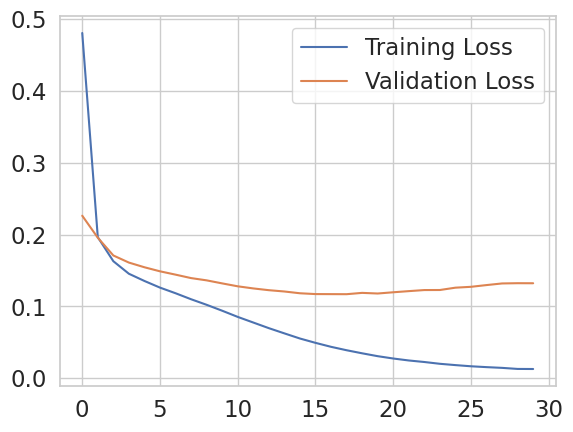

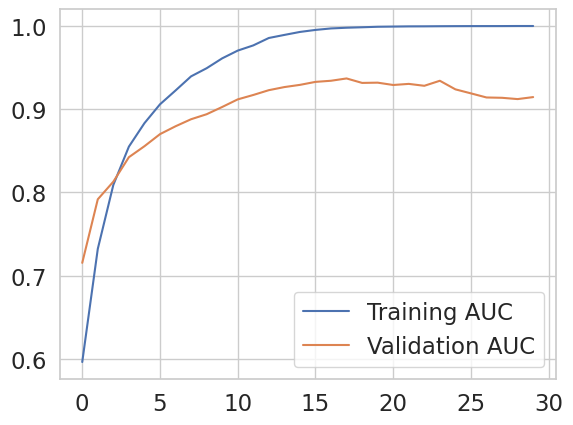

In [63]:
# Plotting losses wrt epochs(time)
plt.plot(history.history["loss"], label="Training Loss") 
plt.plot(history.history["val_loss"], label="Validation Loss")
plt.legend()
plt.show()
# Plotting accuracy wrt epochs(time)
plt.plot(history.history["auc_3"], label="Training AUC")
plt.plot(history.history["val_auc_3"], label="Validation AUC")
plt.legend()
plt.show()

In [64]:
metrics = model.evaluate(X_test, y_test)
print("{}: {}".format(model.metrics_names[1], metrics[1]))



14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - auc_3: 0.9093 - loss: 0.1456
compile_metrics: 0.9031096696853638


In [65]:
X_test

array([[   0,    0,    0, ..., 1968,  120,  852],
       [   0,    0,    0, ...,   92,  407, 3324],
       [   0,    0,    0, ...,    1,   17,  848],
       ...,
       [   0,    0,    0, ...,   83,   86,    4],
       [   0,    0,    0, ..., 2099,  974,  380],
       [   0,    0,    0, ...,    5,  676,  445]], dtype=int32)

In [59]:
#description = "Fits most wrist sizesCompatible with most Apple® iOS and Android cell phones22mm stainless steel bandWater-resistant designAt-a-glance notifications"
prediction = categoryPredictionNN(description)
prediction

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


[('bilgisayar', 0.25580892),
 ('cep telefonu', 0.03561272),
 ('elektronik', 0.022046236),
 ('oyun - hobi', 0.0127411205),
 ('yazılım', 0.009059151),
 ('tüketici elektroniği', 0.008346965),
 ('çevre birimleri', 0.007720488),
 ('küçük ev aletleri', 0.007344874),
 ('aksesuar & sarf malz.', 0.005822416),
 ('bilgisayar bileşenleri', 0.0058157537)]